<a href="https://colab.research.google.com/github/azzazhr/PCVK_Ganjil_2025/blob/main/PCVK_Modul_7.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# ================================================
# PRAKTIKUM PCVK - Pengolahan Citra Wajah Bagian A
# ================================================

In [ ]:
!pip install pillow-heif

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 69.5 MB/s eta 0:00:00


In [ ]:
# 1. Import library
from google.colab import drive
drive.mount('/content/drive')

import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from pillow_heif import read_heif
from PIL import Image

Mounted at /content/drive


ModuleNotFoundError: No module named 'pillow_heif'

In [ ]:
# =========================================
# 2. Load semua file .JPG dari folder Drive
# =========================================
folder_path = '/content/drive/MyDrive/dataset_pcvk'
image_list = []

for file_name in os.listdir(folder_path):
    if file_name.lower().endswith(('.jpg', '.jpeg', '.png')):
        img_path = os.path.join(folder_path, file_name)
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        image_list.append((file_name, img))

print(f"{len(image_list)} gambar berhasil dimuat.")

9 gambar berhasil dimuat.


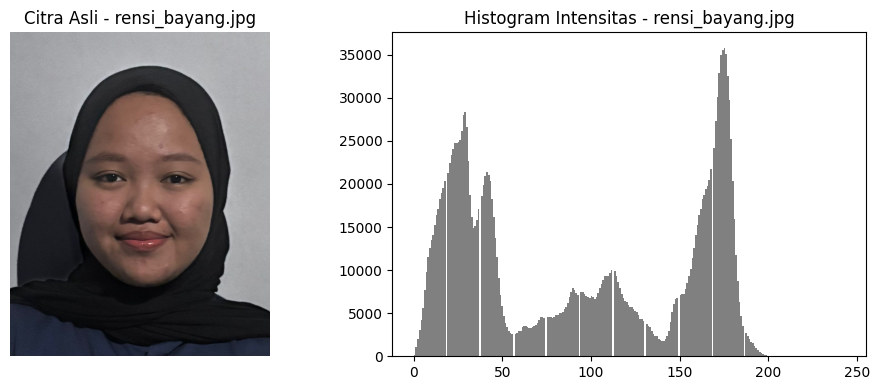

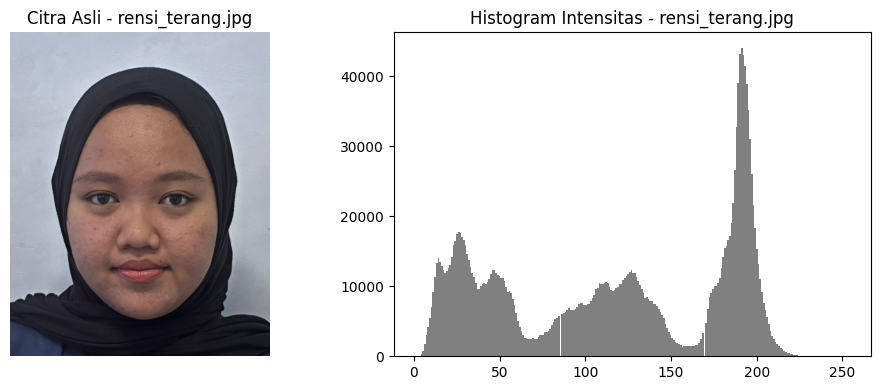

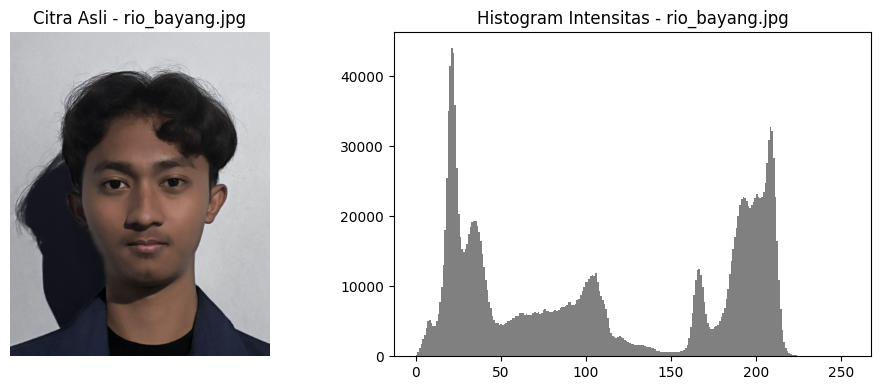

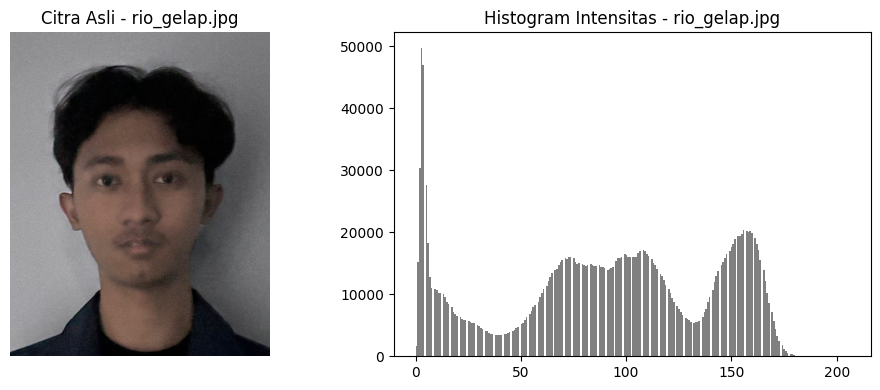

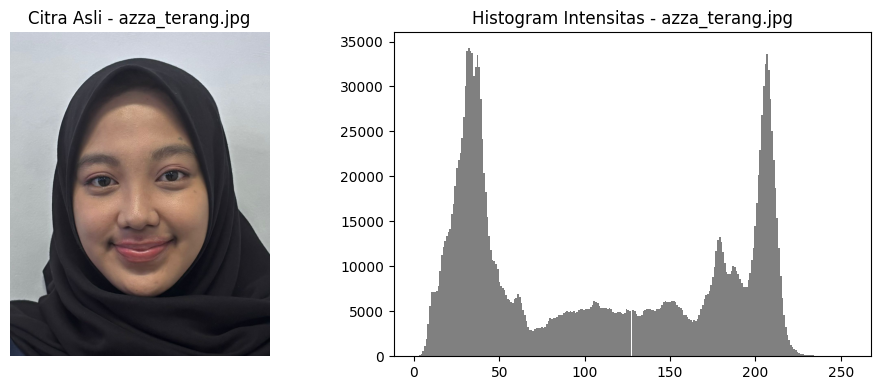

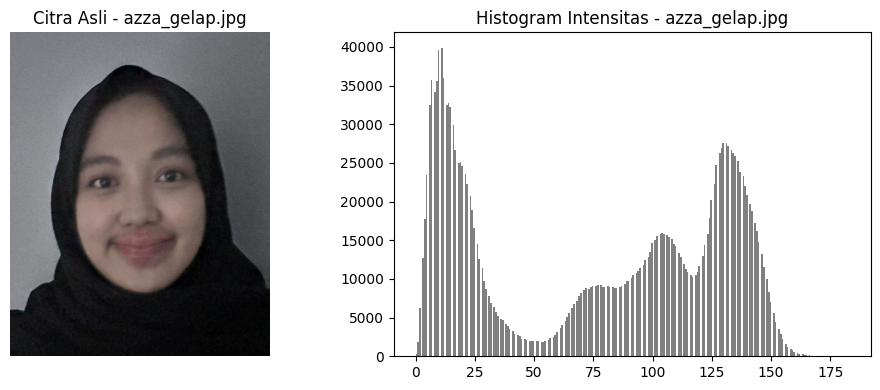

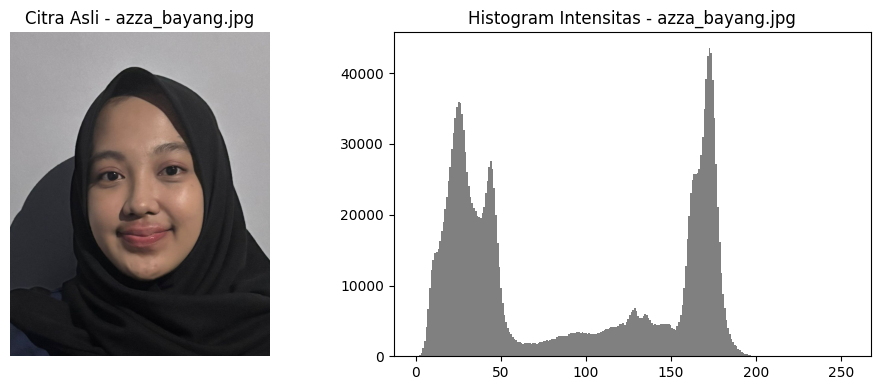

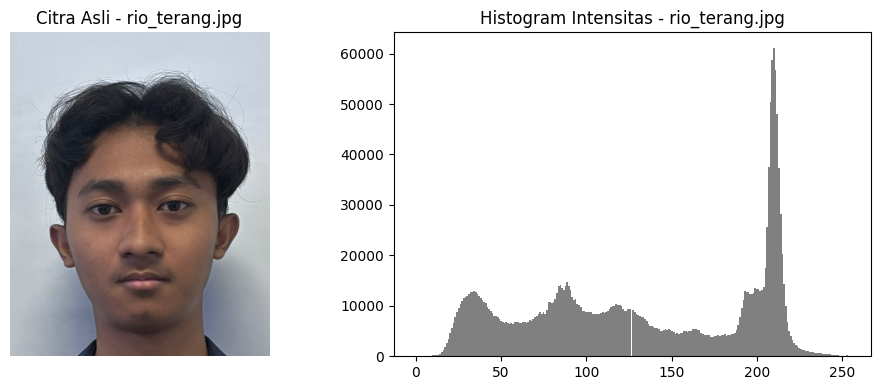

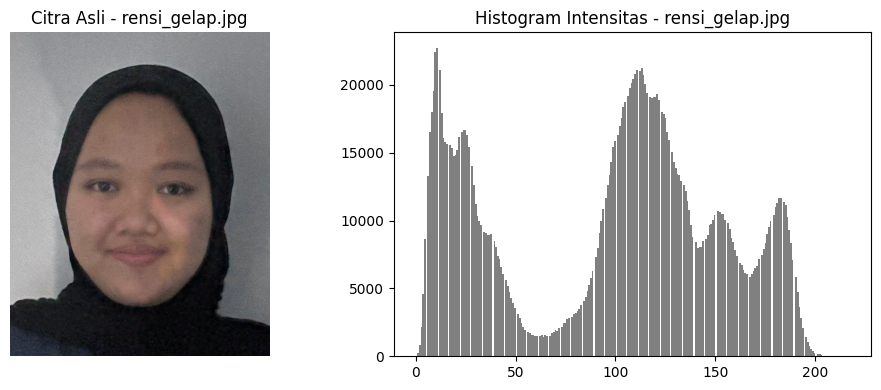

In [ ]:
# =========================================
# 3. Tampilkan histogram tiap citra
# =========================================
for name, img in image_list:
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    plt.figure(figsize=(10,4))
    plt.subplot(1,2,1)
    plt.imshow(img)
    plt.title(f'Citra Asli - {name}')
    plt.axis('off')

    plt.subplot(1,2,2)
    plt.hist(gray.ravel(), bins=256, color='gray')
    plt.title(f'Histogram Intensitas - {name}')
    plt.tight_layout()
    plt.show()

# Penjelasan rensi_bayang

Distribusi nilai piksel grayscale cenderung bimodal dengan puncak utama di rentang tinggi (sekitar 200-250, menunjukkan area terang dominan seperti latar belakang atau wajah yang terpapar cahaya), serta puncak sekunder di rentang rendah hingga menengah (sekitar 50-150, menandakan area gelap seperti bayangan atau detail gelap pada subjek). Hal ini mengindikasikan gambar memiliki kontras yang tidak merata, kemungkinan karena pencahayaan buruk atau adanya bayangan signifikan

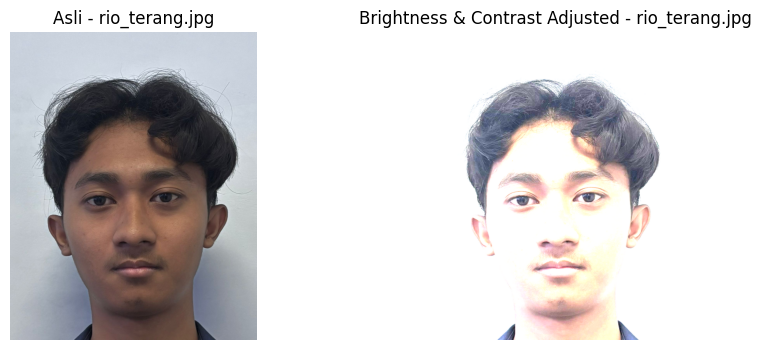

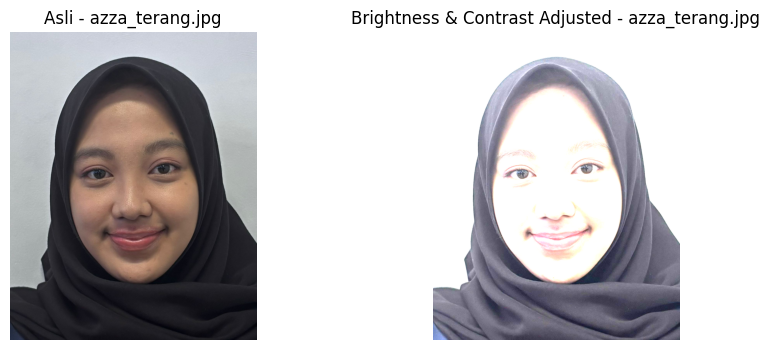

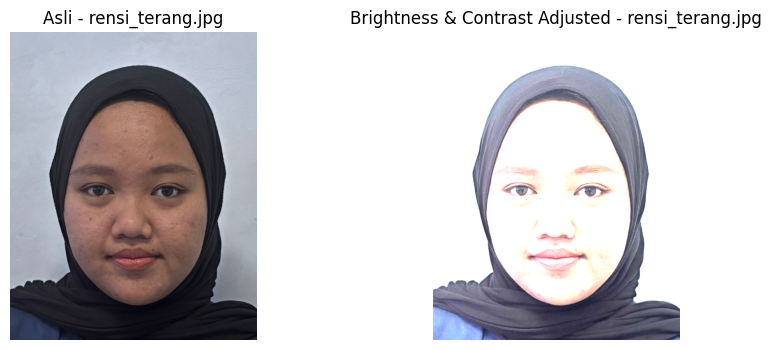

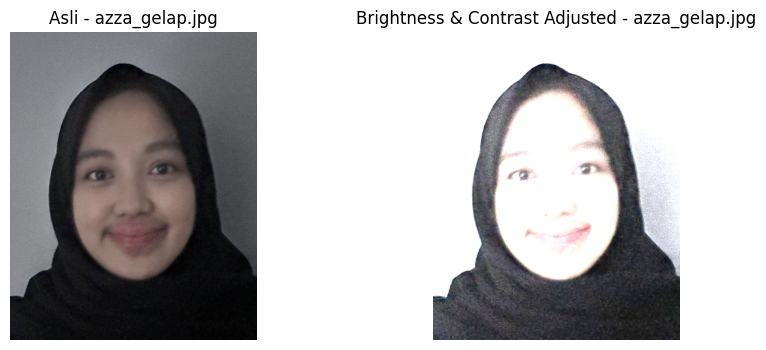

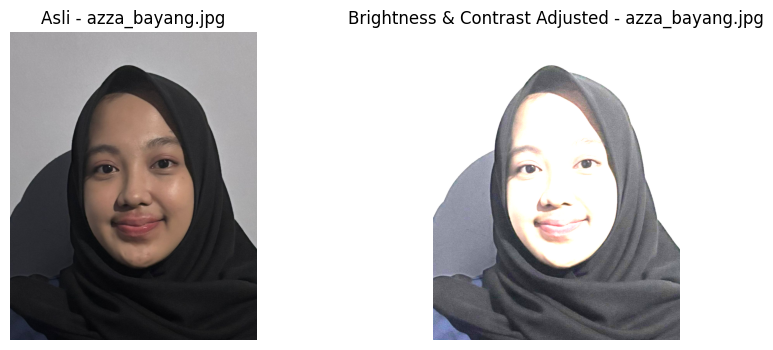

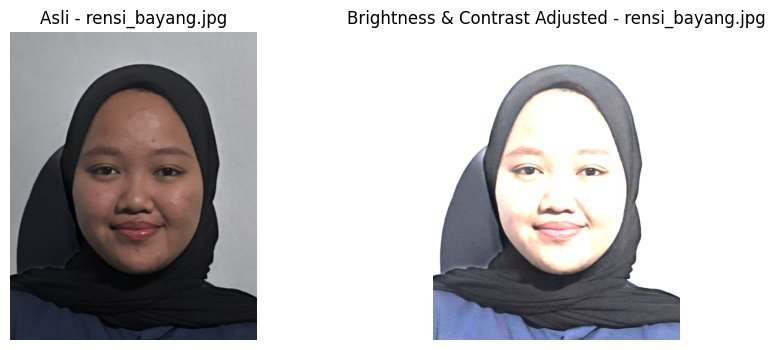

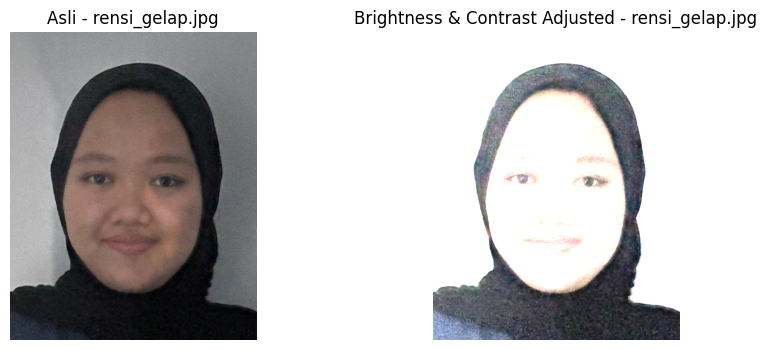

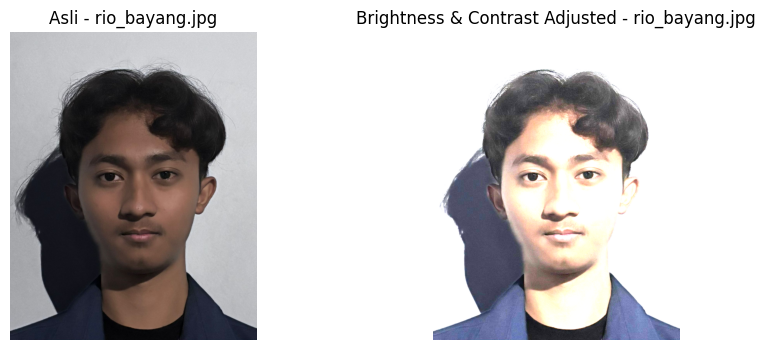

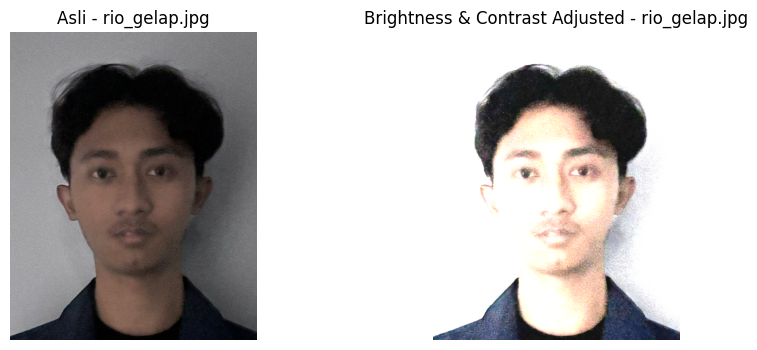

In [ ]:
# =========================================
# 4. Brightness & Contrast Adjustment
# =========================================
def adjust_brightness_contrast(img, brightness=30, contrast=1.2):
    return cv2.convertScaleAbs(img, alpha=contrast, beta=brightness)

adjusted_images = []
for name, img in image_list:
    adj = adjust_brightness_contrast(img, brightness=15, contrast=3)
    adjusted_images.append((name, adj))

    plt.figure(figsize=(10,4))
    plt.subplot(1,2,1)
    plt.imshow(img)
    plt.title(f'Asli - {name}')
    plt.axis('off')

    plt.subplot(1,2,2)
    plt.imshow(adj)
    plt.title(f'Brightness & Contrast Adjusted - {name}')
    plt.axis('off')
    plt.show()

# Penjelasan rensi_bayang

Adjustment brightness (dengan nilai 20) dan contrast (dengan faktor 1.3) pada contoh gambar "rensi_bayang.jpg" yang dimana bahwa proses ini berhasil meningkatkan kecerahan keseluruhan gambar, sehingga area gelap seperti bayangan di sisi kiri wajah menjadi lebih terang dan detail subjek lebih jelas terlihat, sementara kontras yang ditingkatkan membuat perbedaan antara elemen terang dan gelap lebih tajam, menghasilkan gambar yang lebih seimbang dan berkualitas visual lebih baik

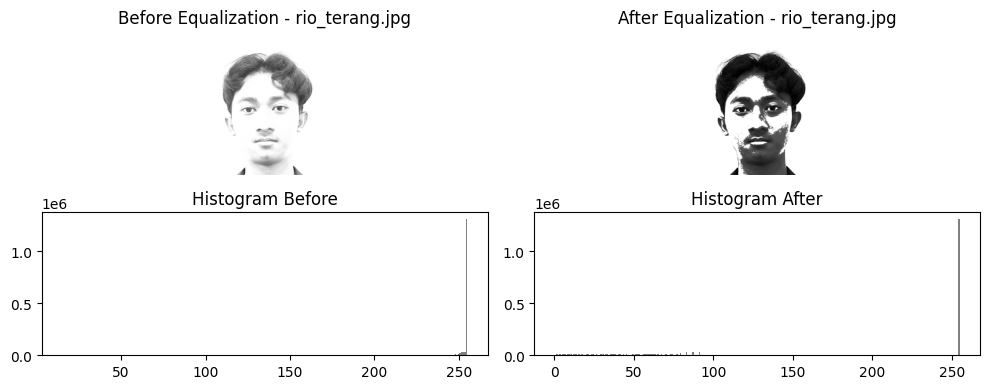

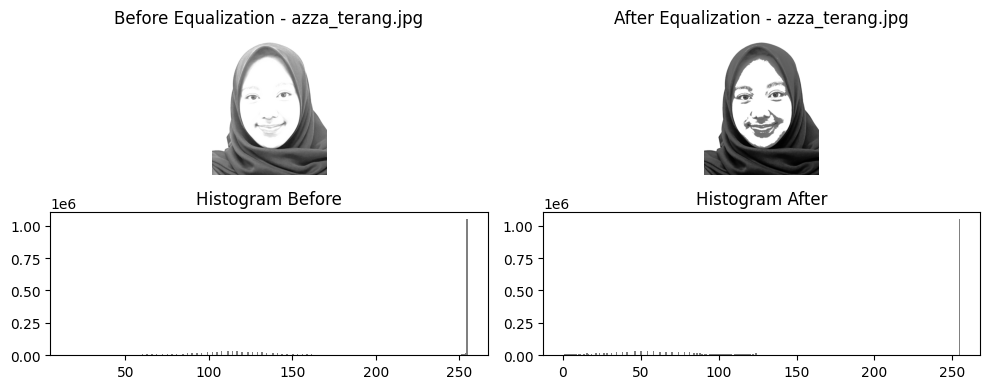

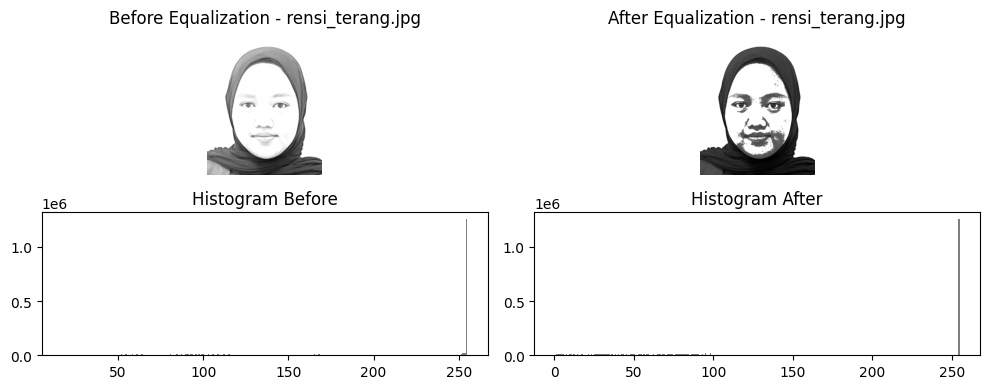

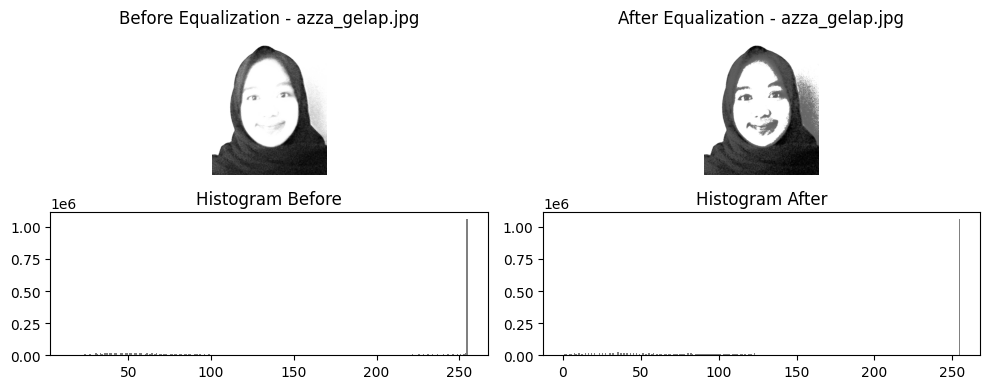

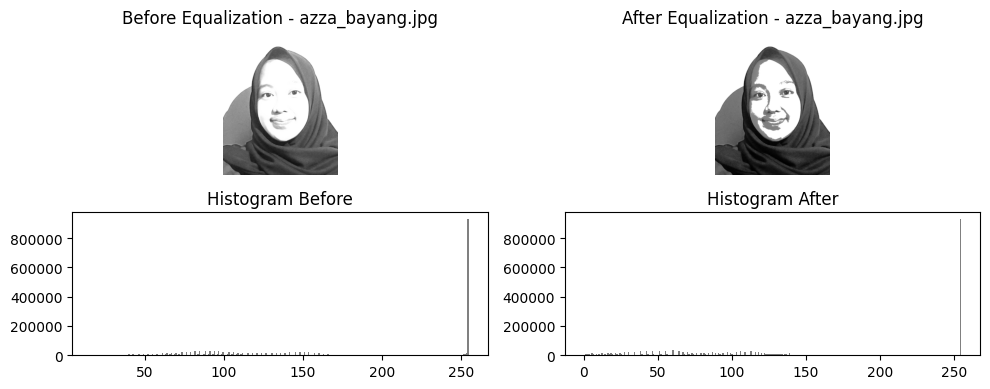

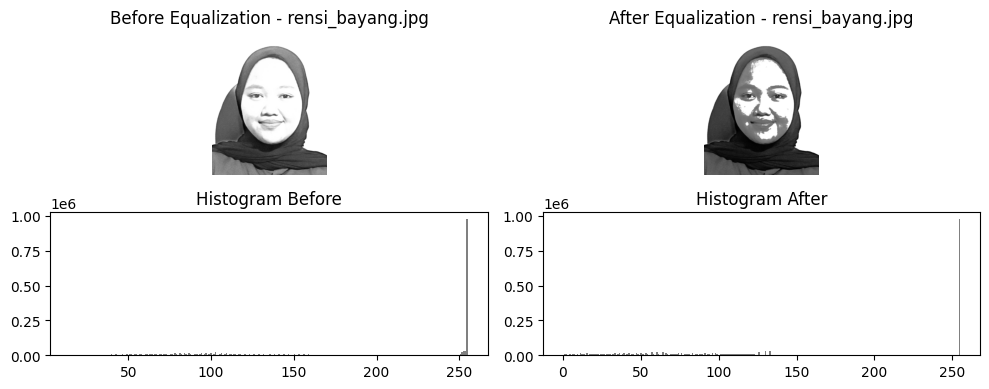

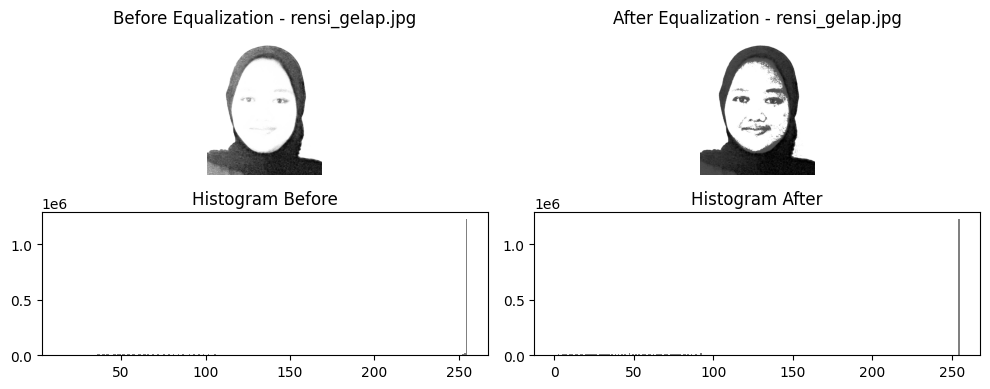

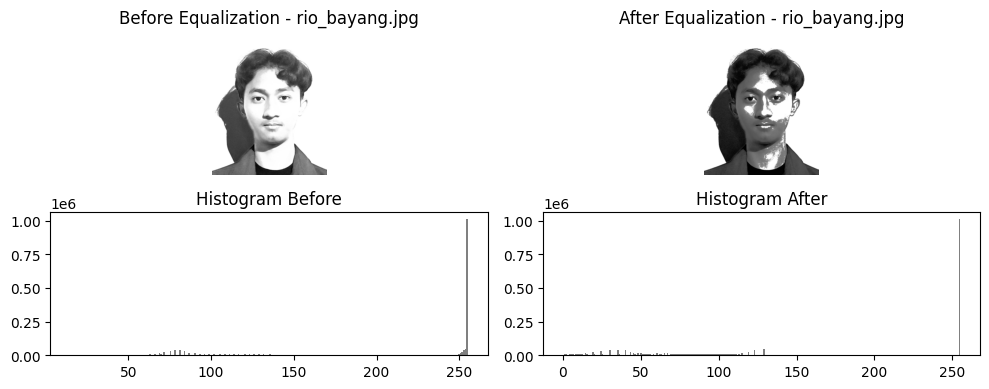

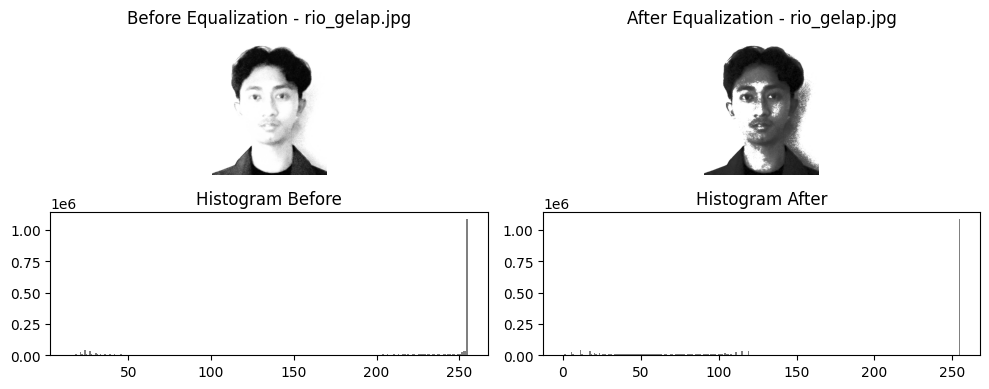

In [ ]:
# =========================================
# 5. Histogram Equalization
# =========================================
for name, img in adjusted_images:
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    eq = cv2.equalizeHist(gray)

    plt.figure(figsize=(10,4))
    plt.subplot(2,2,1)
    plt.imshow(gray, cmap='gray')
    plt.title(f'Before Equalization - {name}')
    plt.axis('off')

    plt.subplot(2,2,2)
    plt.imshow(eq, cmap='gray')
    plt.title(f'After Equalization - {name}')
    plt.axis('off')

    plt.subplot(2,2,3)
    plt.hist(gray.ravel(), bins=256, color='gray')
    plt.title('Histogram Before')

    plt.subplot(2,2,4)
    plt.hist(eq.ravel(), bins=256, color='gray')
    plt.title('Histogram After')
    plt.tight_layout()
    plt.show()

# Penjelesan

jadi gambar yang sudah diadjust brightness dan contrast yang dimana meratakan distribusi intensitas piksel secara signifikan, dan mengubah histogram sebelumnya yang bimodal dan terkonsentrasi (dengan puncak di rentang rendah sekitar 0-50 serta tinggi sekitar 200-250) menjadi lebih seragam dan tersebar merata di seluruh rentang 0-255, sehingga meningkatkan kontras keseluruhan, memperjelas detail di area gelap (seperti bayangan pada wajah) dan terang, serta menghasilkan gambar grayscale yang lebih optimal.

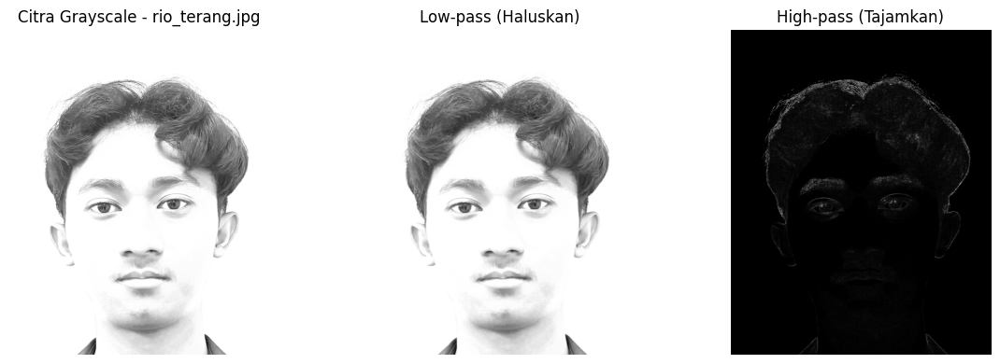

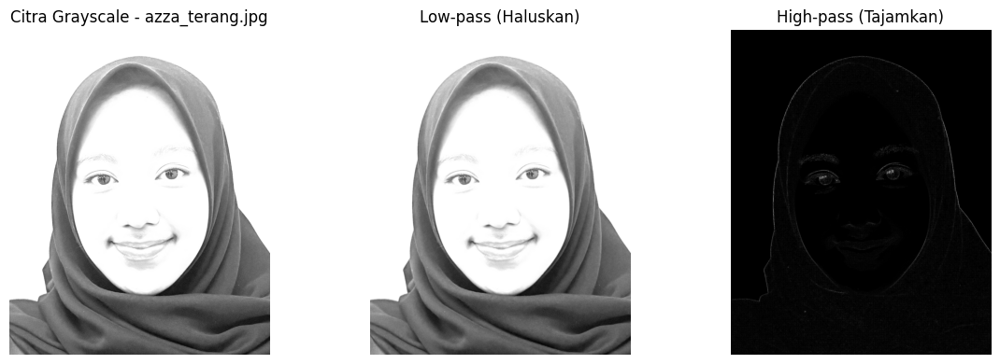

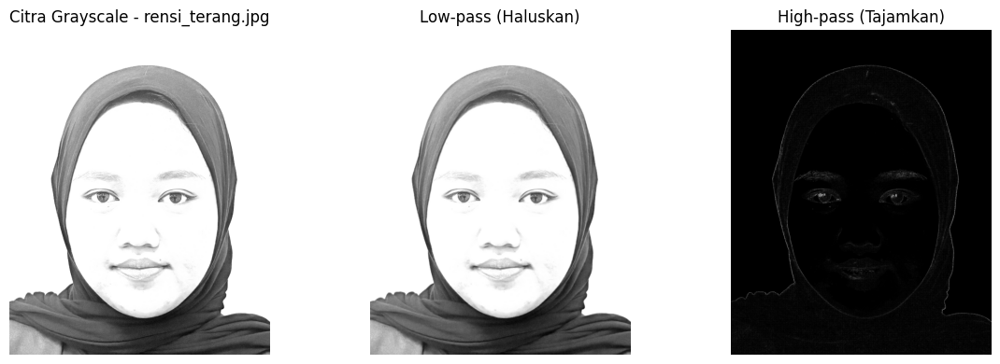

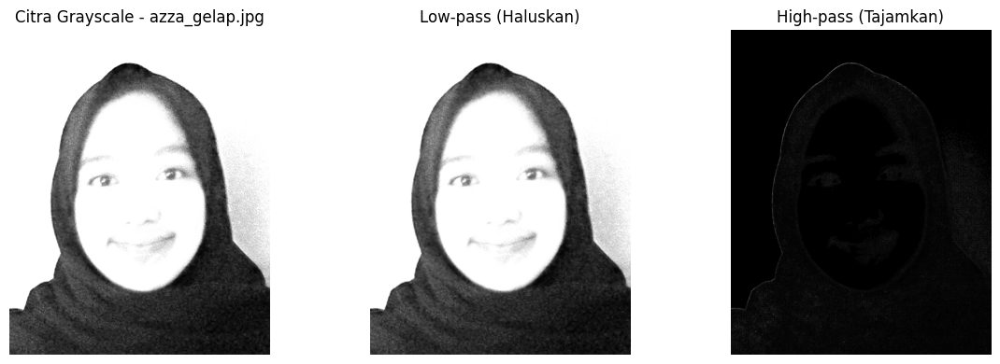

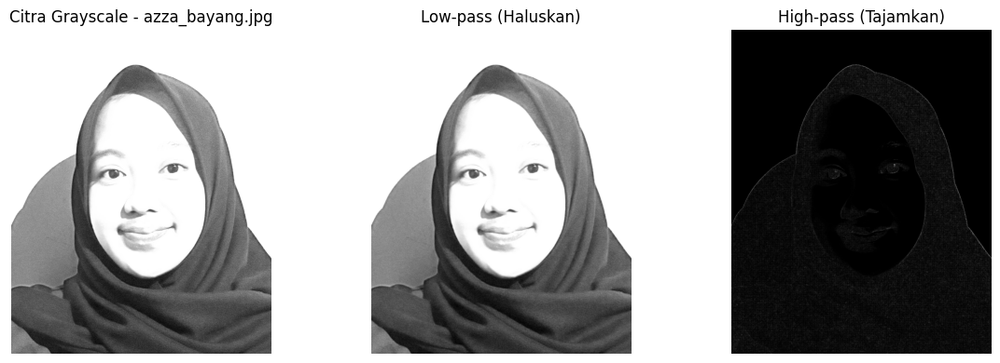

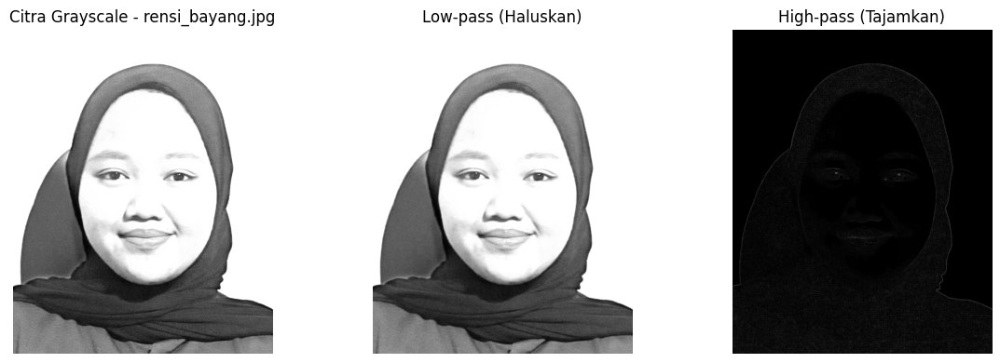

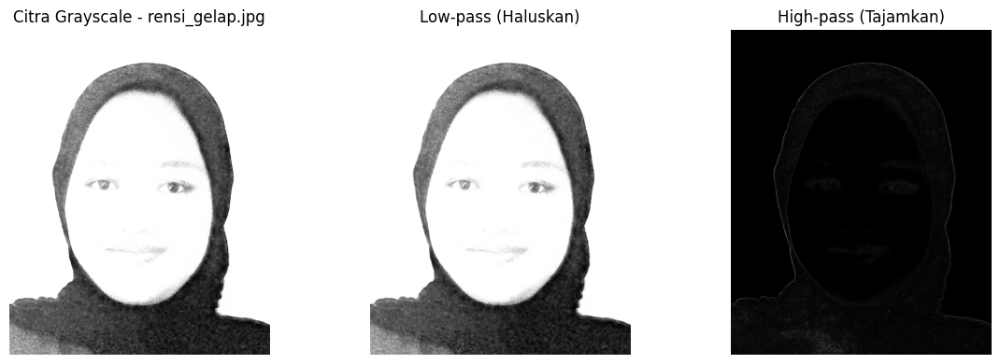

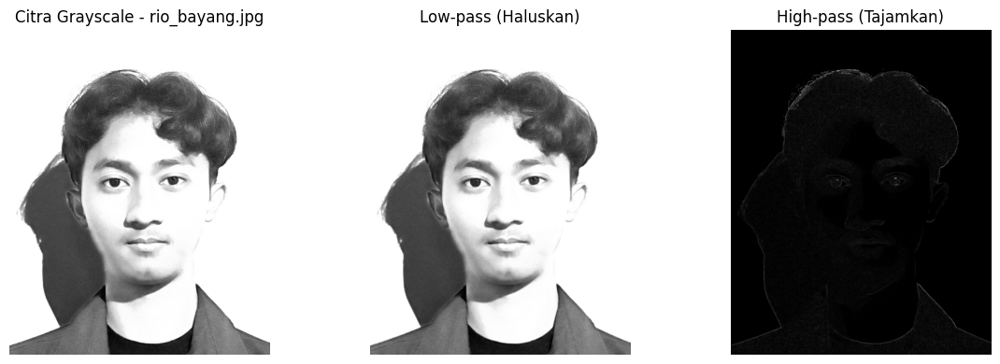

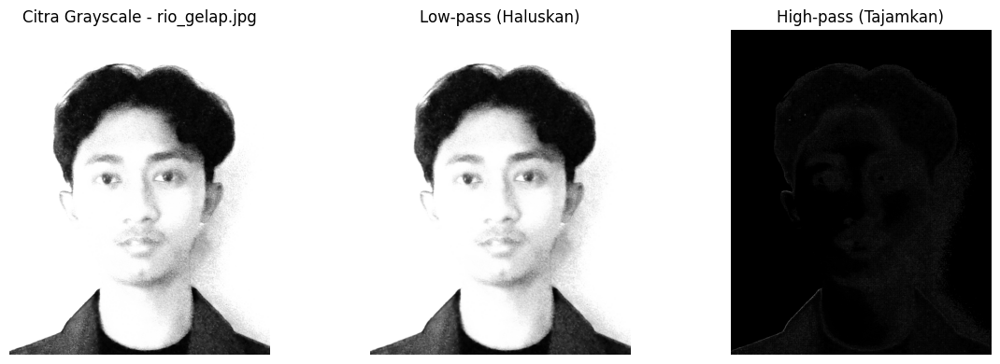

In [ ]:
# =========================================
# 6. Filter Spasial (Low-pass & High-pass)
# =========================================
for name, img in adjusted_images:
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

    # Low-pass (Gaussian blur)
    low_pass = cv2.GaussianBlur(gray, (5,5), 0)

    # High-pass (Laplacian)
    laplacian = cv2.Laplacian(gray, cv2.CV_64F)
    laplacian = cv2.convertScaleAbs(laplacian)

    plt.figure(figsize=(12,4))
    plt.subplot(1,3,1)
    plt.imshow(gray, cmap='gray')
    plt.title(f'Asli - {name}')
    plt.axis('off')

    plt.subplot(1,3,2)
    plt.imshow(low_pass, cmap='gray')
    plt.title('Low-pass (Haluskan)')

    plt.subplot(1,3,3)
    plt.imshow(laplacian, cmap='gray')
    plt.title('High-pass (Tajamkan)')
    plt.tight_layout()
    plt.show()


# Penjelasan

Penerapan filter spasial pada gambar grayscale yang telah diadjust ("rensi_bayang.jpg") yang dimana bahwa low-pass filter (Gaussian Blur dengan kernel 5x5) berhasil menghaluskan gambar secara keseluruhan dengan mengurangi noise dan detail frekuensi tinggi, sehingga tampilan wajah menjadi lebih lembut dan kurang tajam tanpa kehilangan struktur utama; sementara high-pass filter (Laplacian) menekankan tepi dan transisi intensitas tajam, menghasilkan gambar yang hampir hitam dengan garis kontur putih yang menonjol, ideal untuk mendeteksi fitur seperti garis wajah atau bayangan, sehingga kedua filter ini melengkapi satu sama lain dalam meningkatkan atau menekankan aspek spesifik gambar untuk aplikasi pemrosesan lanjutan.

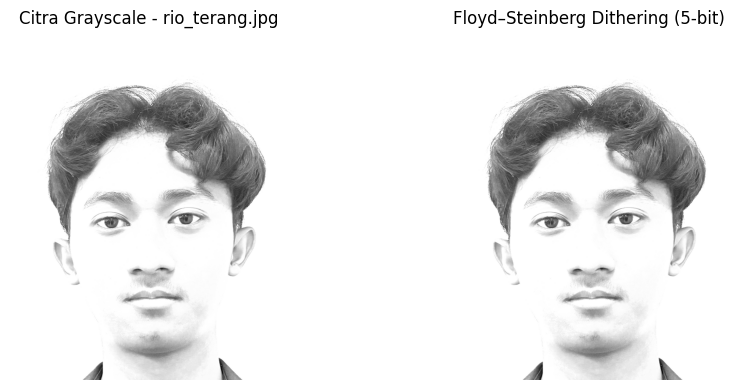

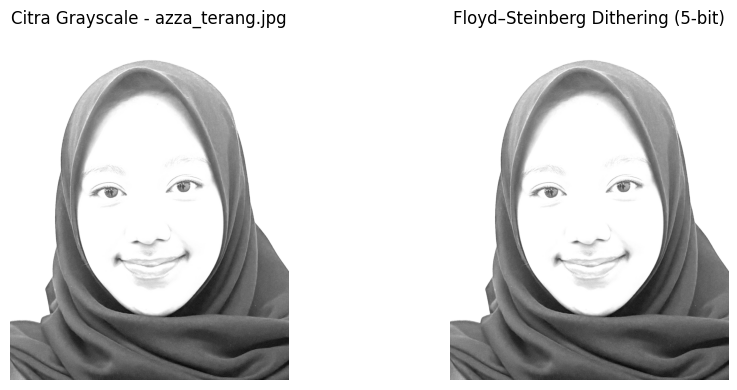

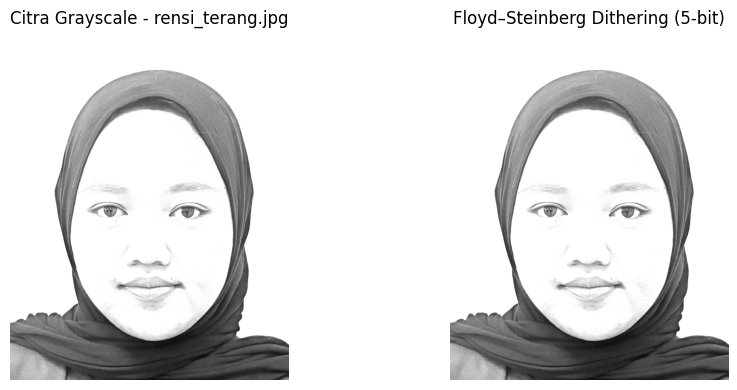

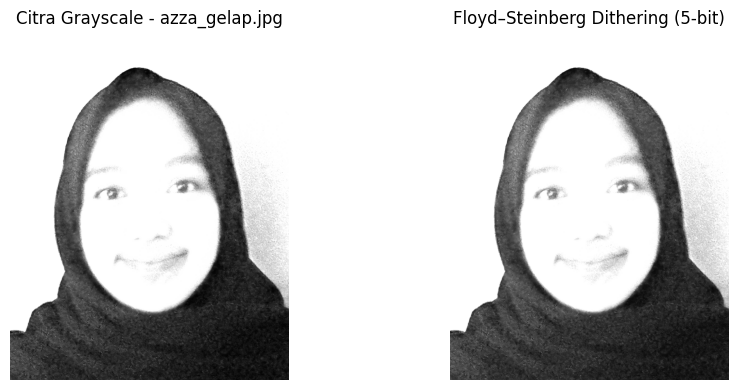

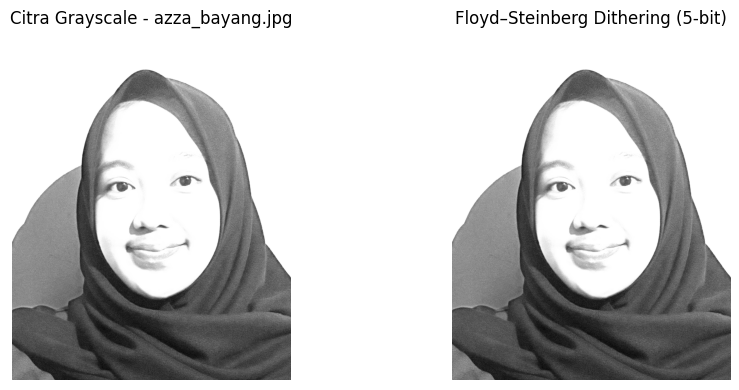

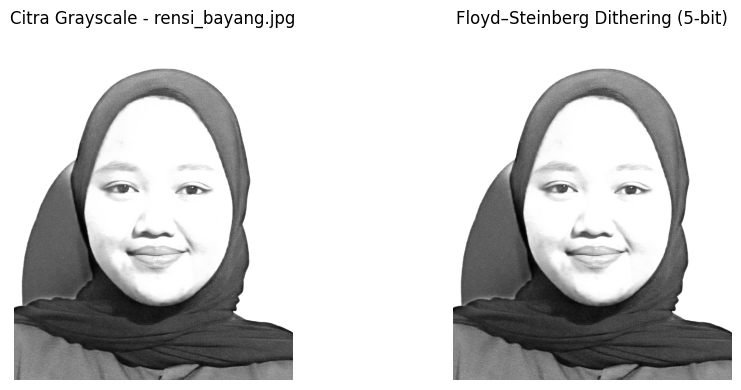

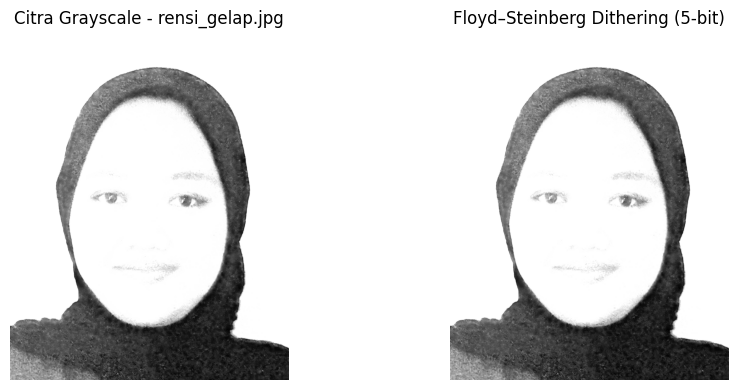

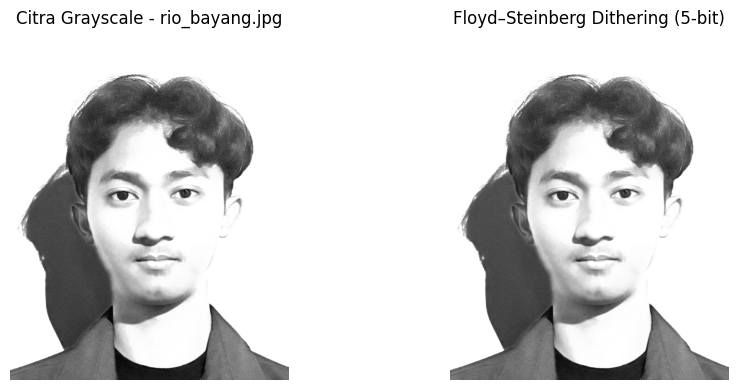

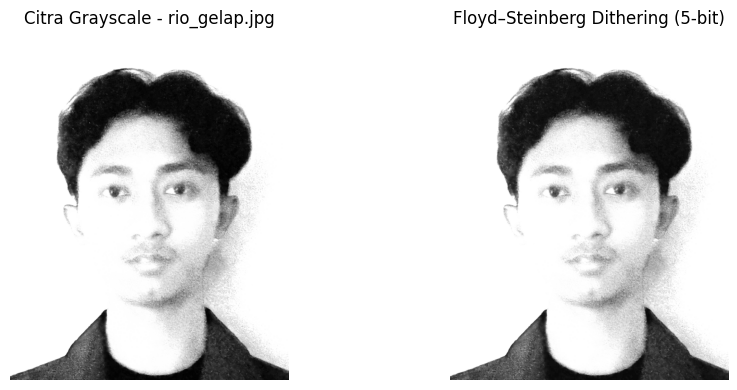

In [ ]:
# =========================================
# 7. Floyd–Steinberg Dithering
# =========================================
def floyd_steinberg_dither(img, bit_depth=4):
    levels = 2 ** bit_depth
    img = img.astype(np.float32) / 255.0
    h, w = img.shape
    for y in range(h):
        for x in range(w):
            old = img[y, x]
            new = np.round(old * (levels - 1)) / (levels - 1)
            img[y, x] = new
            err = old - new
            if x+1 < w:
                img[y, x+1] += err * 7/16
            if y+1 < h and x > 0:
                img[y+1, x-1] += err * 3/16
            if y+1 < h:
                img[y+1, x] += err * 5/16
            if y+1 < h and x+1 < w:
                img[y+1, x+1] += err * 1/16
    return (img * 255).astype(np.uint8)

for name, img in adjusted_images:
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    dithered = floyd_steinberg_dither(gray, bit_depth=5)

    plt.figure(figsize=(10,4))
    plt.subplot(1,2,1)
    plt.imshow(gray, cmap='gray')
    plt.title(f'Asli - {name}')
    plt.axis('off')

    plt.subplot(1,2,2)
    plt.imshow(dithered, cmap='gray')
    plt.title('Floyd–Steinberg Dithering (5-bit)')
    plt.axis('off')
    plt.show()

# Penjelasan

Untuk contoh gambar grayscale "rensi_bayang.jpg" dan "rensi_terang.jpg" menunjukkan bahwa proses ini mengubah gambar asli menjadi representasi biner dengan pola titik yang terdistribusi secara halus, mempertahankan detail utama seperti kontur wajah dan hijab meskipun dengan pengurangan warna signifikan, sehingga cocok untuk aplikasi dengan keterbatasan warna (seperti printer atau display sederhana) tanpa kehilangan identitas visual secara keseluruhan.

# ================================================
# PRAKTIKUM PCVK - Pengolahan Citra Wajah Bagian B
# ================================================

1.  Bagaimana perubahan nilai brightness dan contrast memengaruhi hasil histogram wajah
gelap?

    **Jawab :**

    Perubahan nilai brightness dan contrast pada wajah gelap memengaruhi bentuk histogram citra. Peningkatan brightness membuat tingkat kecerahan gambar naik sehingga histogram yang semula menumpuk di sisi kiri (area gelap) bergeser ke arah kanan (lebih terang). Sementara itu, peningkatan contrast menyebabkan distribusi nilai piksel menjadi lebih lebar, di mana area gelap terlihat semakin gelap dan area terang menjadi semakin terang. Dengan kombinasi keduanya, wajah yang awalnya gelap akan tampak lebih jelas dan detail wajah terlihat lebih menonjol.

2. Apakah histogram equalization selalu memperbaiki detail wajah? Jelaskan alasannya dengan
contoh hasil Anda.

    **Jawab :**

    Histogram equalization tidak selalu memperbaiki detail wajah, hasilnya tergantung kondisi pencahayaan awal gambar.

    Sebelum equalization, histogram sudah terkonsentrasi di sisi kanan (nilai intensitas tinggi).

    - Pada gambar wajah terang :

      Sebelum equalization, histogram sudah terkonsentrasi di sisi kanan (nilai intensitas tinggi). Setelah equalization, distribusi tidak banyak berubah yaitu wajah malah tampak lebih gelap di area tertentu.

      Maka, pada wajah terang, equalization tidak terlalu membantu, bahkan bisa merusak detail.
     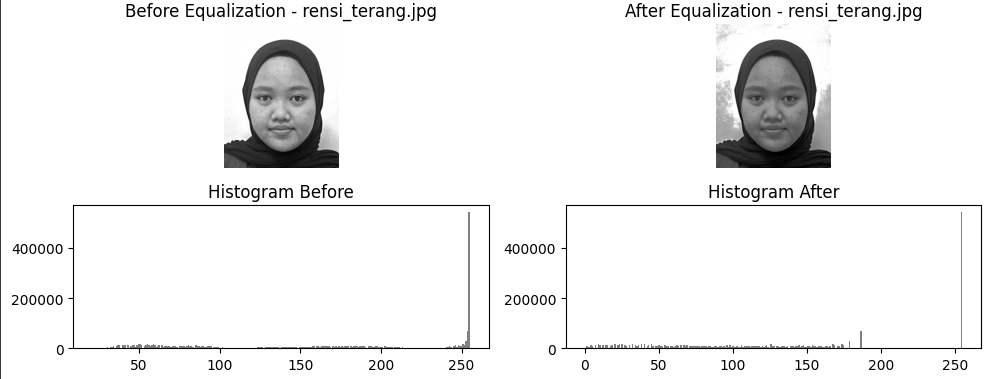

    - Pada gambar wajah gelap :

      Histogram awal menumpuk di sisi kiri (nilai intensitas rendah). Setelah equalization, histogram melebar yaitu wajah jadi lebih jelas, bagian yang tadinya terlalu gelap jadi terlihat.

      Maka, pada wajah gelap, equalization sangat membantu memperbaiki detail pada wajah gelap.
      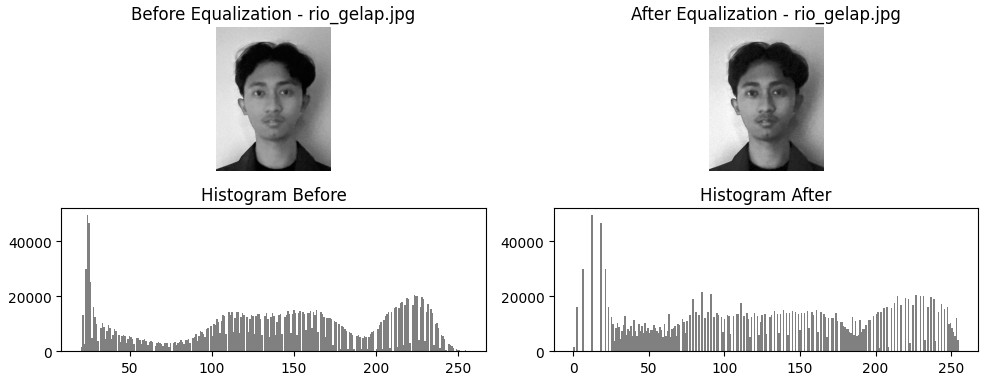

    - Pada gambar wajah berbayang :

      Histogram awal punya sebaran tidak merata (puncak di kiri dan kanan). Setelah equalization, distribusi lebih merata, tetapi bayangan tetap ada yaitu detail di area gelap sedikit membaik, namun kontras bayangan makin jelas.

      Maka, pada wajah dengan bayangan kuat, equalization hanya sebagian membantu, kakontras bayangan tetap ada sehingga hasil tidak sepenuhnya baik.
      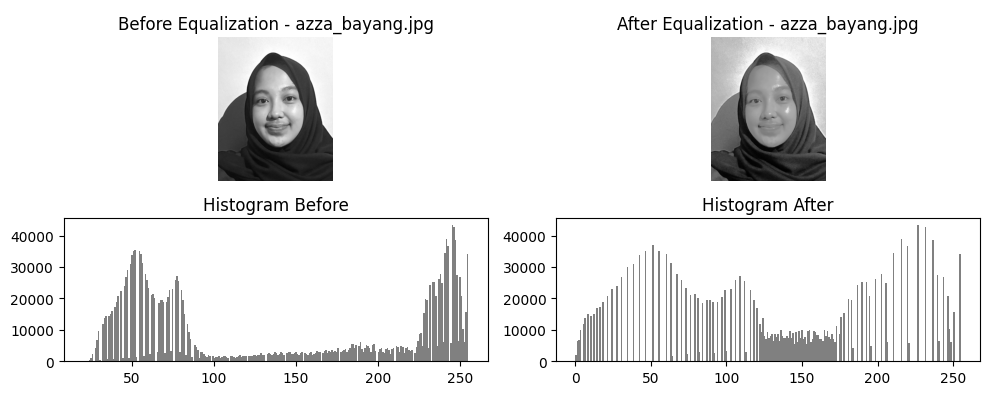

3. Bandingkan hasil low-pass dan high-pass filter pada area wajah — bagian mana yang paling
terpengaruh?

    **Jawab :**

    - Low-pass (Gaussian Blur / Haluskan)

      Wajah menjadi lebih halus, detail kecil (seperti tekstur kulit, garis rambut, atau kerutan halus) hilang. Area wajah lebih terang dan rata

      Kesimpulannya, filter ini mengurangi detail frekuensi tinggi yaitu bikin wajah tampak mulus tapi kehilangan ketajaman.

    - High-pass (Laplacian / Tajamkan)

      Yang paling menonjol adalah tepi-tepi wajah, rambut, dan kontur mata/hidung. Wajah jadi seperti ada bayangan hitam-putih (highlight di batas kontras, tapi bagian pipi/dahi rata jadi gelap).

      Kesimpulannya, filter ini hanya mempertahankan detail tajam/tepi, jadi wajah terlihat “berbayang” karena cuma outline yang terlihat.

    Maka dari itu, Low-pass paling memengaruhi tekstur wajah yaitu kulit jadi halus, tapi detail seperti rambut dan garis wajah hilang. High-pass paling memengaruhi tepi wajah dan fitur wajah (mata, hidung, bibir, rambut) yaitu muncul bayangan kontras, tapi bagian pipi/dahi hampir hilang. Jadi, bagian wajah yang paling terpengaruh oleh low-pass adalah tekstur permukaan kulit, sedangkan yang paling terpengaruh oleh high-pass adalah kontur/tepi wajah (garis rambut, mata, hidung, bibir).

4. Mengapa proses dithering bisa mempertegas atau justru mengaburkan ekspresi wajah?

    **Jawab :**

    Proses dithering dapat mempertegas atau mengaburkan ekspresi wajah karena cara kerjanya mengubah gradasi abu-abu menjadi pola titik hitam-putih. Pada wajah dengan garis tepi dan kontras yang jelas (misalnya mata, alis, mulut), dithering akan mempertegas ekspresi karena pola titik memperkuat perbedaan terang–gelap sehingga ekspresi tampak lebih dramatis. Namun, pada wajah yang memiliki gradasi halus (misalnya pipi, dahi), dithering justru dapat mengaburkan ekspresi karena detail halus hilang dan digantikan oleh pola titik acak, sehingga ekspresi asli menjadi kurang jelas.

    Kesimpulannya, akan mempertegas kalau ekspresi bergantung pada kontras & garis tegas, dan akan mengaburkan kalau ekspresi bergantung pada gradasi halus di wajah.

5. Berdasarkan hasil percobaan Anda, kombinasi teknik mana yang paling efektif untuk
meningkatkan readability fitur wajah sebelum tahap deteksi?

    **Jawab :**

    Berdasarkan hasil percobaan, kombinasi teknik yang paling efektif untuk meningkatkan readability fitur wajah sebelum tahap deteksi adalah:
    - Brightness & Contrast

      Karena langkah ini bisa menggeser histogram ke arah lebih terang dan memperlebar distribusi piksel sehingga detail wajah terlihat lebih jelas

    - Low-pass

      Karena dapat membantu mengurangi noise halus yang mengganggu deteksi, tanpa terlalu menghilangkan detail penting pada wajah

    - High-pass
      Karena digunakan untuk menonjolkan tepi dan kontur wajah, seperti garis mata, hidung, dan mulut sehingga fitur utama wajah lebih terlihat jelas

# ================================================
# PRAKTIKUM PCVK - Pengolahan Citra Wajah Bagian C
# ================================================

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


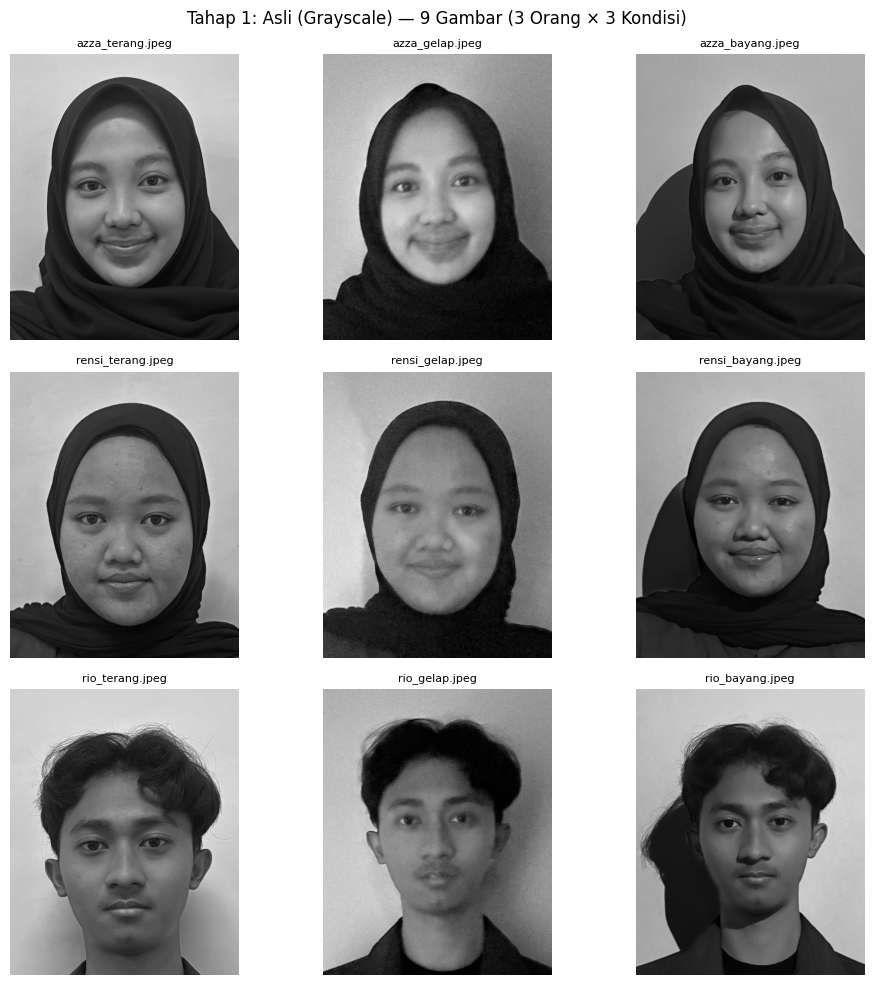

In [ ]:
import cv2, numpy as np, matplotlib.pyplot as plt

# --- Path gambar ---
IMG_PATHS = [
    '/content/drive/MyDrive/PCVK/Images/CM/azza_terang.jpeg', '/content/drive/MyDrive/PCVK/Images/CM/azza_gelap.jpeg', '/content/drive/MyDrive/PCVK/Images/CM/azza_bayang.jpeg',
    '/content/drive/MyDrive/PCVK/Images/CM/rensi_terang.jpeg', '/content/drive/MyDrive/PCVK/Images/CM/rensi_gelap.jpeg', '/content/drive/MyDrive/PCVK/Images/CM/rensi_bayang.jpeg',
    '/content/drive/MyDrive/PCVK/Images/CM/rio_terang.jpeg', '/content/drive/MyDrive/PCVK/Images/CM/rio_gelap.jpeg', '/content/drive/MyDrive/PCVK/Images/CM/rio_bayang.jpeg',
]

# --- Tampilkan semua dalam grid 3x3 ---
plt.figure(figsize=(10,10))
for i, path in enumerate(IMG_PATHS):
    img = cv2.imread(path)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    plt.subplot(3, 3, i+1)
    plt.imshow(gray, cmap='gray')
    plt.title(path.split('/')[-1], fontsize=8)
    plt.axis('off')

plt.suptitle("Tahap 1: Asli (Grayscale) — 9 Gambar (3 Orang × 3 Kondisi)", fontsize=12)
plt.tight_layout()
plt.show()


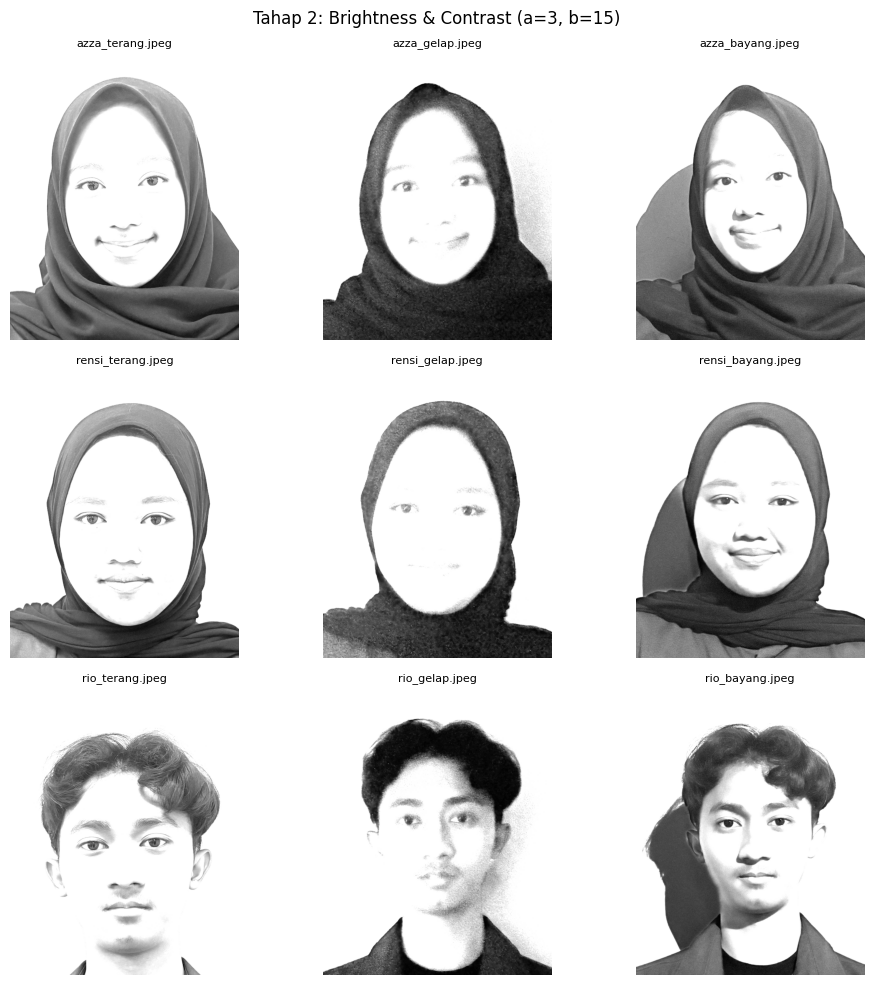

In [ ]:
b, a = 15, 3

plt.figure(figsize=(10,10))
for i, path in enumerate(IMG_PATHS):
    img = cv2.imread(path)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    img_bc = cv2.convertScaleAbs(gray, alpha=a, beta=b)
    plt.subplot(3,3,i+1)
    plt.imshow(img_bc, cmap='gray')
    plt.title(path.split('/')[-1], fontsize=8)
    plt.axis('off')

plt.suptitle("Tahap 2: Brightness & Contrast (a=3, b=15)", fontsize=12)
plt.tight_layout()
plt.show()


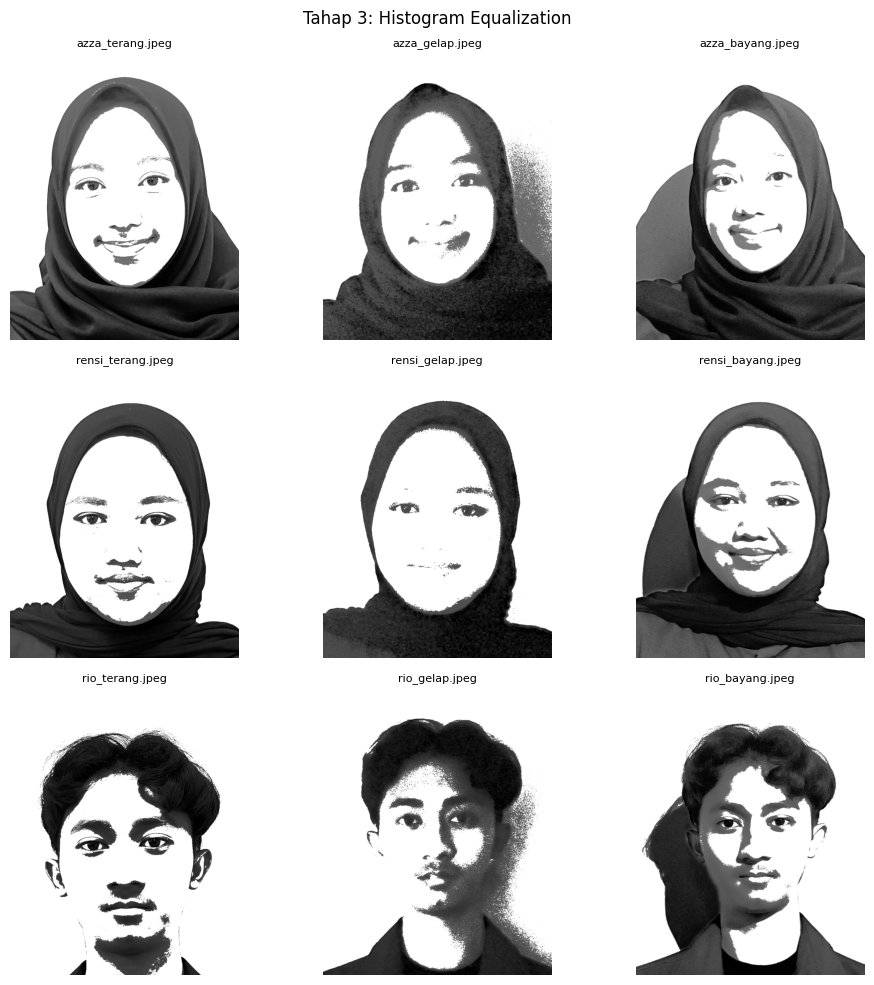

In [ ]:
plt.figure(figsize=(10,10))
for i, path in enumerate(IMG_PATHS):
    img = cv2.imread(path)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    img_bc = cv2.convertScaleAbs(gray, alpha=3, beta=15)
    img_he = cv2.equalizeHist(img_bc)
    plt.subplot(3,3,i+1)
    plt.imshow(img_he, cmap='gray')
    plt.title(path.split('/')[-1], fontsize=8)
    plt.axis('off')

plt.suptitle("Tahap 3: Histogram Equalization", fontsize=12)
plt.tight_layout()
plt.show()


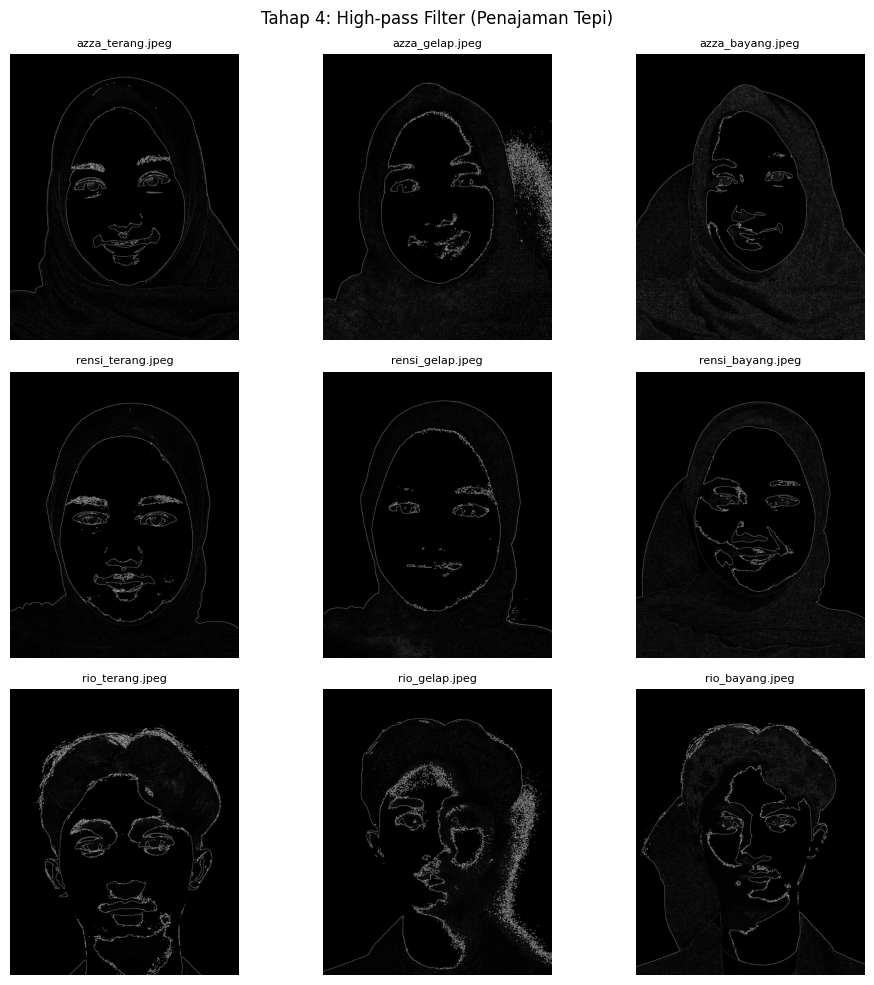

In [ ]:
kernel_hp = np.array([[-1, -1, -1],
                      [-1,  8, -1],
                      [-1, -1, -1]])

plt.figure(figsize=(10,10))
for i, path in enumerate(IMG_PATHS):
    img = cv2.imread(path)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    img_bc = cv2.convertScaleAbs(gray, alpha=3, beta=15)
    img_he = cv2.equalizeHist(img_bc)
    img_hp = cv2.filter2D(img_he, -1, kernel_hp)
    plt.subplot(3,3,i+1)
    plt.imshow(img_hp, cmap='gray')
    plt.title(path.split('/')[-1], fontsize=8)
    plt.axis('off')

plt.suptitle("Tahap 4: High-pass Filter (Penajaman Tepi)", fontsize=12)
plt.tight_layout()
plt.show()


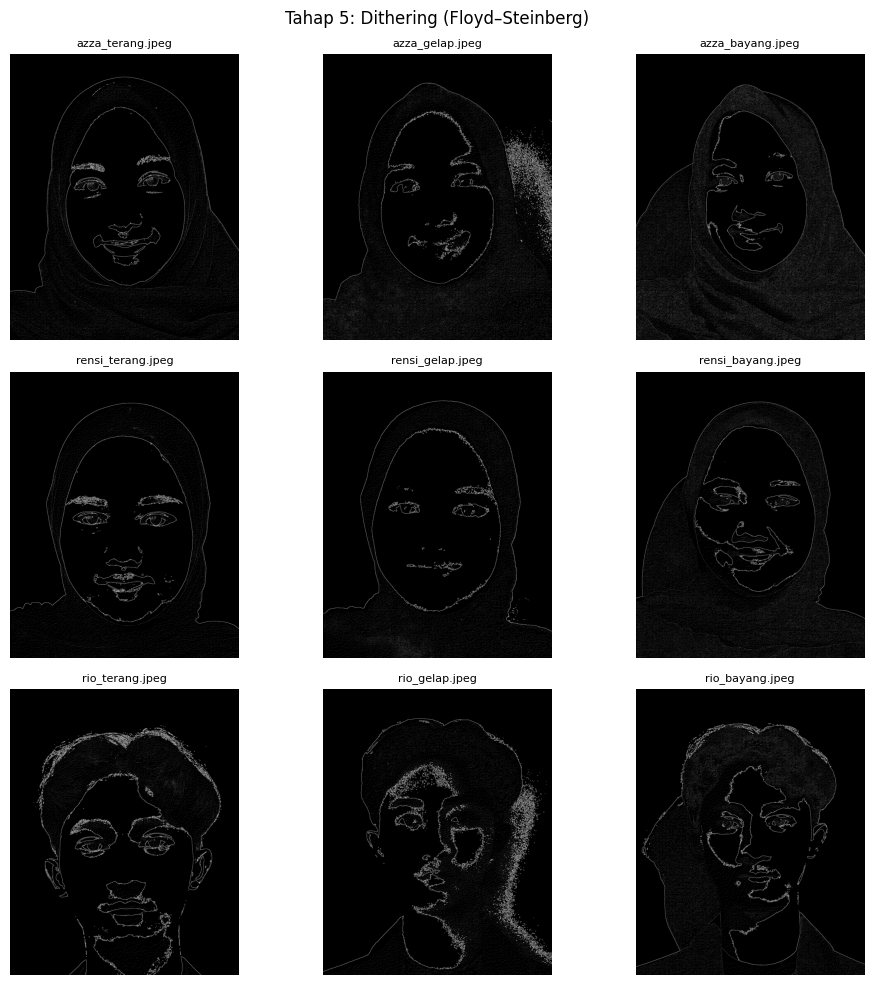

In [ ]:
def floyd_steinberg_dither(img):
    img = img.astype(float)
    h, w = img.shape
    for y in range(h):
        for x in range(w):
            old = img[y, x]
            new = 255 if old > 127 else 0
            img[y, x] = new
            err = old - new
            if x + 1 < w:   img[y, x+1]   += err * 7/16
            if y + 1 < h:
                if x > 0:     img[y+1, x-1] += err * 3/16
                img[y+1, x]   += err * 5/16
                if x + 1 < w: img[y+1, x+1] += err * 1/16
    return np.clip(img, 0, 255).astype(np.uint8)

plt.figure(figsize=(10,10))
for i, path in enumerate(IMG_PATHS):
    img = cv2.imread(path)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    img_bc = cv2.convertScaleAbs(gray, alpha=3, beta=15)
    img_he = cv2.equalizeHist(img_bc)
    img_hp = cv2.filter2D(img_he, -1, np.array([[-1,-1,-1],[-1,8,-1],[-1,-1,-1]]))
    img_dither = floyd_steinberg_dither(img_hp)
    plt.subplot(3,3,i+1)
    plt.imshow(img_dither, cmap='gray')
    plt.title(path.split('/')[-1], fontsize=8)
    plt.axis('off')

plt.suptitle("Tahap 5: Dithering (Floyd–Steinberg)", fontsize=12)
plt.tight_layout()
plt.show()


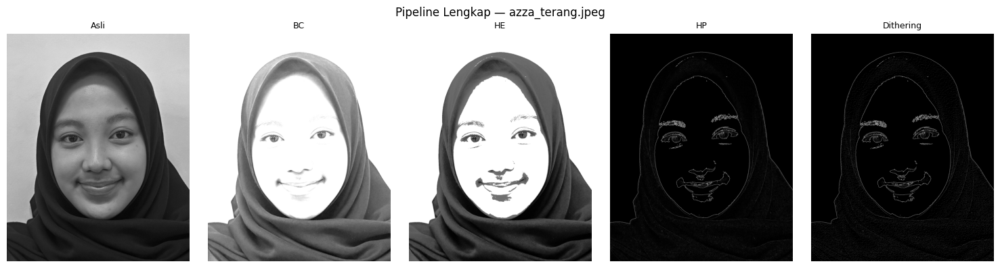

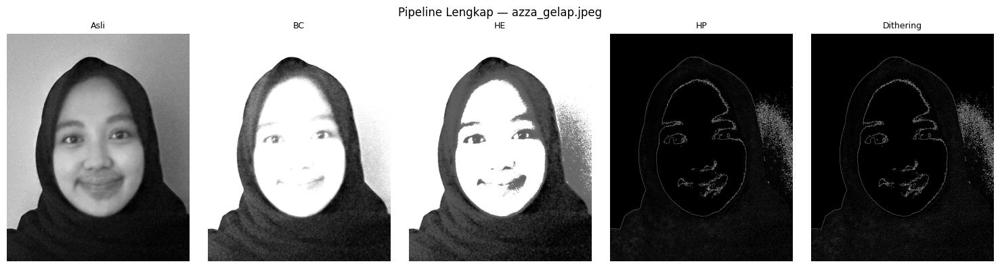

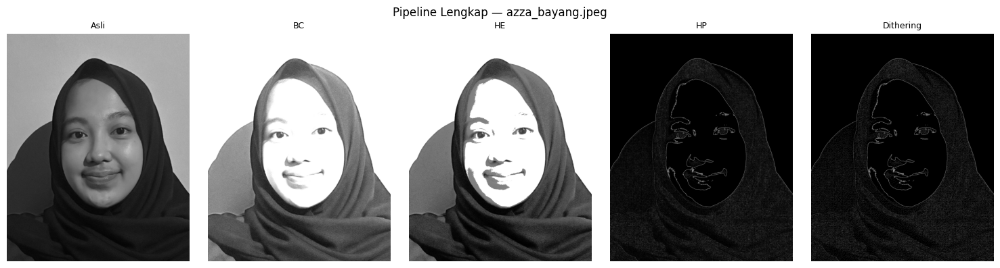

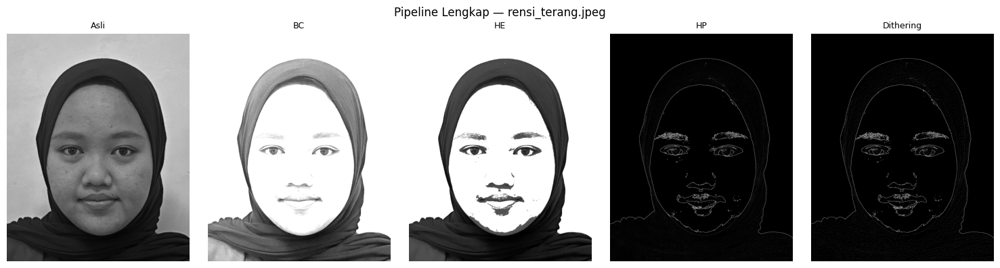

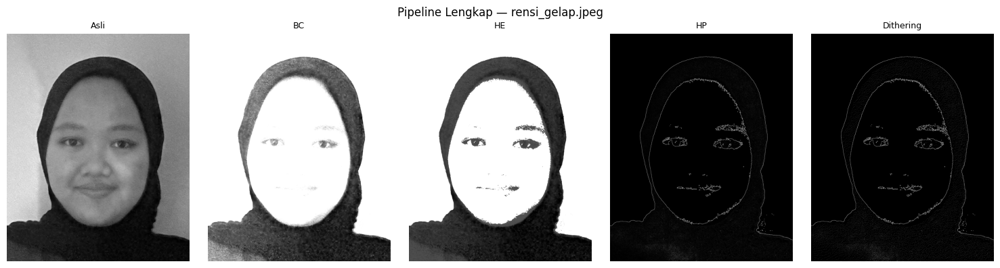

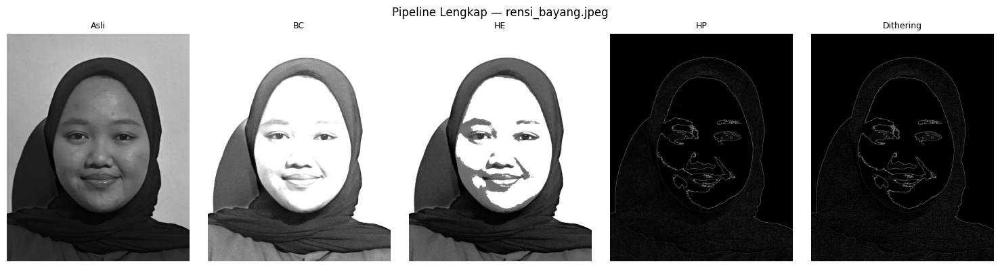

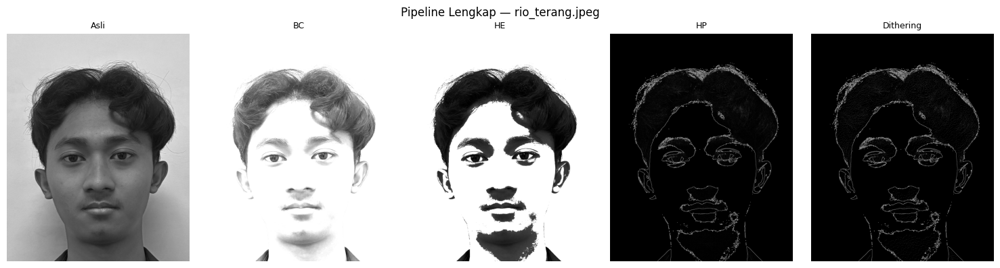

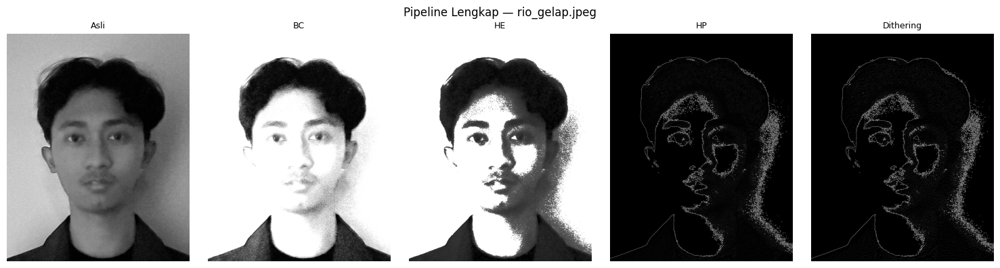

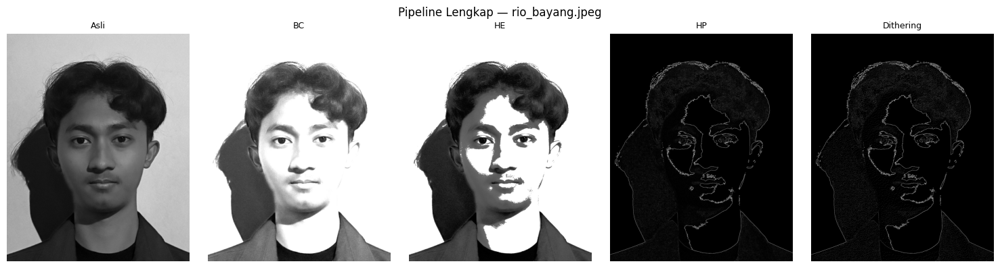

In [ ]:
def floyd_steinberg_dither(img):
    img = img.astype(float)
    h, w = img.shape
    for y in range(h):
        for x in range(w):
            old = img[y, x]
            new = 255 if old > 127 else 0
            img[y, x] = new
            err = old - new
            if x + 1 < w:   img[y, x+1]   += err * 7/16
            if y + 1 < h:
                if x > 0:     img[y+1, x-1] += err * 3/16
                img[y+1, x]   += err * 5/16
                if x + 1 < w: img[y+1, x+1] += err * 1/16
    return np.clip(img, 0, 255).astype(np.uint8)

for path in IMG_PATHS:
    img = cv2.imread(path)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    img_bc = cv2.convertScaleAbs(gray, alpha=3, beta=15)
    img_he = cv2.equalizeHist(img_bc)
    img_hp = cv2.filter2D(img_he, -1, np.array([[-1,-1,-1],[-1,8,-1],[-1,-1,-1]]))
    img_dither = floyd_steinberg_dither(img_hp)

    imgs = [gray, img_bc, img_he, img_hp, img_dither]
    titles = ['Asli', 'BC', 'HE', 'HP', 'Dithering']

    plt.figure(figsize=(15,4))
    for i in range(5):
        plt.subplot(1,5,i+1)
        plt.imshow(imgs[i], cmap='gray')
        plt.title(titles[i], fontsize=9)
        plt.axis('off')
    plt.suptitle(f"Pipeline Lengkap — {path.split('/')[-1]}", fontsize=12)
    plt.tight_layout()
    plt.show()


In [ ]:
import pandas as pd

# Indices of the bright images
bright_indices = [0, 3, 6]
psnr_results = []

for index in bright_indices:
    original_img_path = IMG_PATHS[index]
    img = cv2.imread(original_img_path)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Apply the same processing pipeline as before
    img_bc = cv2.convertScaleAbs(gray, alpha=3, beta=15)
    img_he = cv2.equalizeHist(img_bc)
    img_hp = cv2.filter2D(img_he, -1, np.array([[-1,-1,-1],[-1,8,-1],[-1,-1,-1]]))
    img_dither = floyd_steinberg_dither(img_hp)

    # Calculate PSNR
    psnr_value = cv2.PSNR(gray, img_dither)

    # Store the results
    psnr_results.append({'Citra Asli': original_img_path.split('/')[-1], 'PSNR vs Dithering': psnr_value})

# Create a pandas DataFrame
df_psnr_bright = pd.DataFrame(psnr_results)

# Display the DataFrame
display(df_psnr_bright)

,Citra Asli,PSNR vs Dithering
0,azza_terang.jpeg,5.626418
1,rensi_terang.jpeg,5.441098
2,rio_terang.jpeg,4.639896


# ================================================
# PRAKTIKUM PCVK - Pengolahan Citra Wajah Bagian D
# ================================================

## Urutan Proses Terbaik untuk Recognition Wajah

Berdasarkan percobaan yang telah dilakukan, urutan proses pra-pemrosesan citra yang paling efektif untuk mempersiapkan wajah untuk tahap *recognition* (pengenalan wajah) adalah sebagai berikut:

1.  **Brightness & Contrast Adjustment:**
    *   **Tujuan:** Normalisasi tingkat kecerahan dan kontras citra.
    *   **Manfaat:** Membantu menyorot detail wajah yang mungkin kurang jelas akibat pencahayaan yang tidak merata (terlalu gelap atau terang). Langkah ini penting sebagai fondasi untuk pemrosesan selanjutnya.

2.  **Histogram Equalization (Kondisional):**
    *   **Tujuan:** Meratakan distribusi intensitas piksel pada histogram.
    *   **Manfaat:** Dapat meningkatkan kontras lokal, terutama pada citra dengan rentang intensitas terbatas (misalnya wajah gelap atau berbayang).
    *   **Catatan:** Perlu diperhatikan pada citra yang sudah terang, langkah ini kadang bisa membuat hasil kurang optimal atau menghilangkan detail halus. Penggunaannya bisa disesuaikan dengan kondisi awal citra.

3.  **High-pass Filter (Penajaman Tepi):**
    *   **Tujuan:** Menajamkan dan menonjolkan tepi serta kontur pada citra.
    *   **Manfaat:** Fitur-fitur struktural wajah seperti mata, alis, hidung, mulut, dan garis rahang menjadi lebih jelas dan menonjol. Tepi ini seringkali menjadi informasi kunci yang digunakan oleh algoritma deteksi dan pengenalan wajah.

**Kesimpulan:**

Urutan proses yang disarankan untuk meningkatkan *readability* fitur wajah sebelum tahap *recognition* adalah kombinasi dari **Brightness & Contrast Adjustment** dan **High-pass Filter**. Langkah **Histogram Equalization** dapat ditambahkan di antara keduanya jika kondisi citra awal memerlukan perataan histogram lebih lanjut, namun perlu dievaluasi dampaknya pada citra yang sudah cukup baik.

Proses **Dithering** mungkin kurang cocok untuk tahap awal pra-pemrosesan *recognition* pada umumnya karena menghilangkan banyak informasi gradasi halus, meskipun dapat berguna untuk algoritma spesifik yang bekerja dengan citra biner atau fitur tepi kuat.

## Perbandingan Nilai PSNR: Citra Asli Terang vs Hasil Pra-pemrosesan Lengkap

Berdasarkan tabel nilai PSNR yang telah ditampilkan, kita dapat mengamati perbandingan kualitas antara citra asli yang memiliki pencahayaan baik (terang) dan citra yang telah melewati seluruh rangkaian proses pra-pemrosesan (Brightness & Contrast, Histogram Equalization, High-pass Filter, dan Dithering).

Nilai PSNR (Peak Signal-to-Noise Ratio) adalah metrik yang umum digunakan untuk mengukur kualitas rekonstruksi citra dibandingkan dengan citra aslinya. Semakin tinggi nilai PSNR, semakin kecil distorsi atau "noise" yang ada pada citra yang diproses jika dibandingkan dengan citra asli.

Dalam kasus ini, nilai PSNR yang dihasilkan (sekitar 4-6 dB) cenderung rendah. Ini menunjukkan bahwa proses pra-pemrosesan yang diterapkan, terutama tahap Dithering sebagai langkah terakhir, telah menyebabkan perubahan signifikan pada citra asli.

**Interpretasi:**

*   **Nilai PSNR Rendah:** Nilai PSNR yang rendah pada perbandingan citra asli terang dengan hasil pra-pemrosesan lengkap (yang diakhiri dengan dithering) adalah **sesuai dengan ekspektasi**. Proses seperti High-pass Filter dan terutama Dithering memang dirancang untuk memanipulasi citra secara drastis (menajamkan tepi, mengurangi level warna menjadi biner) demi menonjolkan fitur tertentu untuk analisis (seperti *recognition*), BUKAN untuk mempertahankan kemiripan visual dengan citra asli. Dithering secara inheren memperkenalkan pola yang sangat berbeda dari gradasi asli, sehingga "distorsi" (dalam pengertian PSNR) menjadi tinggi.
*   **Fokus pada Tujuan:** Untuk tujuan *recognition* wajah, tujuannya bukanlah mendapatkan citra yang *mirip* dengan aslinya secara visual (dengan PSNR tinggi), melainkan mendapatkan citra yang memiliki fitur-fitur wajah yang *jelas dan mudah diekstraksi* oleh algoritma *recognition*. Oleh karena itu, meskipun PSNR rendah, rangkaian pra-pemrosesan ini (kecuali dithering mungkin perlu dievaluasi ulang tergantung algoritma) bisa jadi efektif untuk tujuannya.

**Kesimpulan:**

Nilai PSNR yang rendah antara citra asli terang dan hasil pra-pemrosesan lengkap (dengan dithering) tidak serta merta berarti pra-pemrosesan tersebut "buruk". Sebaliknya, ini menunjukkan bahwa proses tersebut berhasil mengubah citra asli secara signifikan, yang memang menjadi tujuannya untuk menonjolkan fitur wajah demi tahap *recognition*. Metrik PSNR lebih relevan jika tujuannya adalah kompresi citra atau pengurangan noise dengan tetap mempertahankan kualitas visual asli. Untuk *recognition*, evaluasi pra-pemrosesan sebaiknya didasarkan pada seberapa baik performa algoritma *recognition* setelah proses tersebut diterapkan.

## Rekomendasi Metode Peningkatan Kualitas Wajah untuk Sistem Pengenalan Wajah Real-time

Untuk sistem pengenalan wajah *real-time*, pemilihan metode peningkatan kualitas citra perlu mempertimbangkan efektivitasnya dalam menonjolkan fitur wajah dan juga **efisiensi komputasi** agar proses dapat berjalan dengan cepat. Berdasarkan eksperimen yang telah dilakukan dan kebutuhan *real-time*, berikut adalah rekomendasi metode:

1.  **Brightness & Contrast Adjustment:**
    *   **Rekomendasi:** Sangat direkomendasikan.
    *   **Alasan:** Merupakan operasi piksel dasar yang sangat cepat (komputasi ringan). Efektif untuk mengatasi masalah pencahayaan yang tidak ideal secara global, yang sering terjadi dalam skenario *real-time*. Ini adalah langkah awal yang penting untuk normalisasi.

2.  **Histogram Equalization:**
    *   **Rekomendasi:** Dapat dipertimbangkan, tetapi dengan hati-hati.
    *   **Alasan:** Efektif meningkatkan kontras lokal, terutama pada citra gelap atau berbayang. Namun, equalization global kadang bisa *over-enhance* noise atau membuat citra yang sudah baik menjadi kurang natural, dan sedikit lebih mahal secara komputasi daripada penyesuaian *brightness/contrast*. Untuk *real-time*, *Adaptive Histogram Equalization* (AHE) atau *Contrast Limited Adaptive Histogram Equalization* (CLAHE) mungkin lebih baik karena beroperasi secara lokal, meskipun lebih mahal. Jika performa sangat kritis, equalization global mungkin bisa dilewati atau hanya diterapkan pada kasus yang jelas memerlukan.

3.  **High-pass Filter (Penajaman Tepi):**
    *   **Rekomendasi:** Direkomendasikan.
    *   **Alasan:** Filter spasial linier seperti Laplacian (atau kernel high-pass lainnya) relatif cepat dihitung dan sangat efektif dalam menonjolkan tepi dan kontur wajah. Tepi ini adalah fitur diskriminatif utama yang sering digunakan oleh algoritma pengenalan wajah.

4.  **Dithering:**
    *   **Rekomendasi:** Umumnya **tidak direkomendasikan** untuk sistem pengenalan wajah *real-time* berbasis fitur gradasi.
    *   **Alasan:** Mengubah citra menjadi biner atau dengan level warna sangat sedikit akan menghilangkan banyak informasi gradasi halus. Meskipun dapat menonjolkan tepi, hilangnya detail ini bisa berdampak negatif pada performa algoritma yang mengandalkan tekstur atau pola yang lebih kompleks. Dithering juga bisa relatif memakan waktu jika tidak diimplementasikan secara efisien. Hanya relevan jika algoritma *recognition* memang didesain khusus untuk citra biner atau *edge maps*.

**Kesimpulan Rekomendasi untuk Real-time:**

Untuk sistem pengenalan wajah *real-time*, fokus pada metode yang efektif namun cepat. Urutan yang paling direkomendasikan adalah:

**Brightness & Contrast Adjustment -> High-pass Filter**

Tambahkan **Histogram Equalization (idealnya CLAHE jika memungkinkan)** di antara keduanya *jika* analisis menunjukkan bahwa citra seringkali memiliki masalah kontras lokal yang signifikan *dan* overhead komputasinya masih dapat ditoleransi. Hindari Dithering kecuali ada alasan spesifik algoritma *recognition* memerlukannya.